# ERA5 1993-2023 EXTREME VALUE ANALYSIS

Notebook environment to Perform EVA on 30 yrs of ERA5 Data using GEV formula

In [1]:
# pip install --upgrade scipy

In [2]:
import pystac_client
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from itertools import compress
import pandas as pd
import scipy.stats

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
import plotly.graph_objects as go
import plotly.express as px
import os
import math

from tqdm import tqdm
from scipy.stats import genextreme


In [3]:
Annual_max_30yrs=xr.open_zarr(r"E:\ERA5_Ann_max_GLOBAL_1993-2023.zarr")
Annual_max_30yrs

<xarray.Dataset>
Dimensions:    (latitude: 361, longitude: 720, time: 31)
Coordinates:
  * latitude   (latitude) float32 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0
  * longitude  (longitude) float32 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * time       (time) datetime64[ns] 1993-12-31 1994-12-31 ... 2023-12-31
Data variables:
    swh        (time, latitude, longitude) float32 dask.array<chunksize=(1, 361, 720), meta=np.ndarray>
Attributes: (12/22)
    AUTHOR:              European Copernicus Marine Service
    CITATION:            European Copernicus Marine Service. (Year). Reanalys...
    COMMENT:             The dataset represents the significant height of com...
    CRS:                 EPSG:4326
    Conventions:         CF-1.8
    DESCRIPTION:         European Centre for Medium-Range Weather Forecasts (...
    ...                  ...
    TAGS:                ['significant height', 'wind waves', 'swell', 'Hazard']
    TEMPORAL_EXTENT:     ['1993-01-01T00:00:00Z', '2023-12-31T23:59:59Z']
    TITLE:               ERA5 Significant Height of Combined Wind Waves and S...
    TITLE_ABBREVIATION:  ERA5 SWH
    UNITS:               meters
    history:             2024-03-25 17:20:46 GMT by grib_to_netcdf-2.25.1: /o...

In [4]:
var="swh"

In [5]:
def reverse_longitude_converter(lon):
    if lon > 180:
        lon = lon - 360
    else:
        lon = lon
    return lon

Emperical annual maximas=  [ 3.0975347  3.1771011  3.230701   3.2375903  3.306713   3.332634
  3.345027   3.391191   3.4118752  3.6865516  3.807598   3.8748302
  3.9268813  4.028445   4.064507   4.0977736  4.1159444  4.38739
  4.3944097  4.6013737  5.062448   5.152865   5.522653   6.0752187
  6.092879   6.6047125  6.714106   8.675593   9.372393   9.694922
 10.685748 ]
Emperical return periods = [ 1.          1.03333333  1.06896552  1.10714286  1.14814815  1.19230769
  1.24        1.29166667  1.34782609  1.40909091  1.47619048  1.55
  1.63157895  1.72222222  1.82352941  1.9375      2.06666667  2.21428571
  2.38461538  2.58333333  2.81818182  3.1         3.44444444  3.875
  4.42857143  5.16666667  6.2         7.75       10.33333333 15.5
 31.        ]


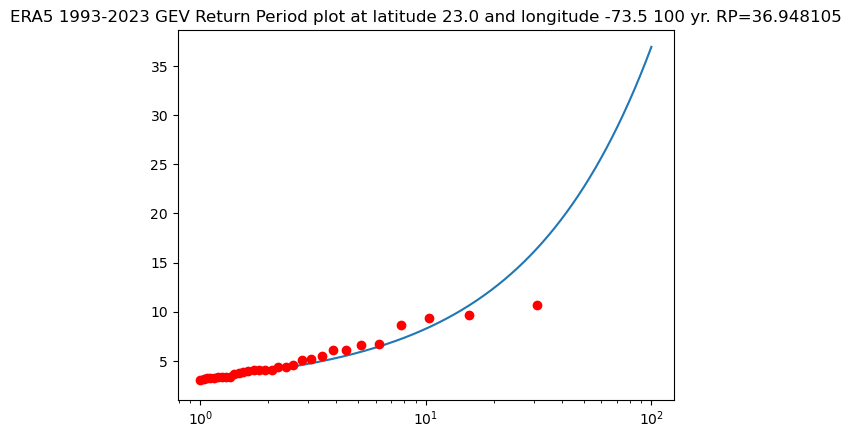

Text(0.5, 1.0, 'ERA5 1993-2023 GEV Return Period plot at latitude 23.0 and longitude -73.5 100 yr. RP=36.948105')

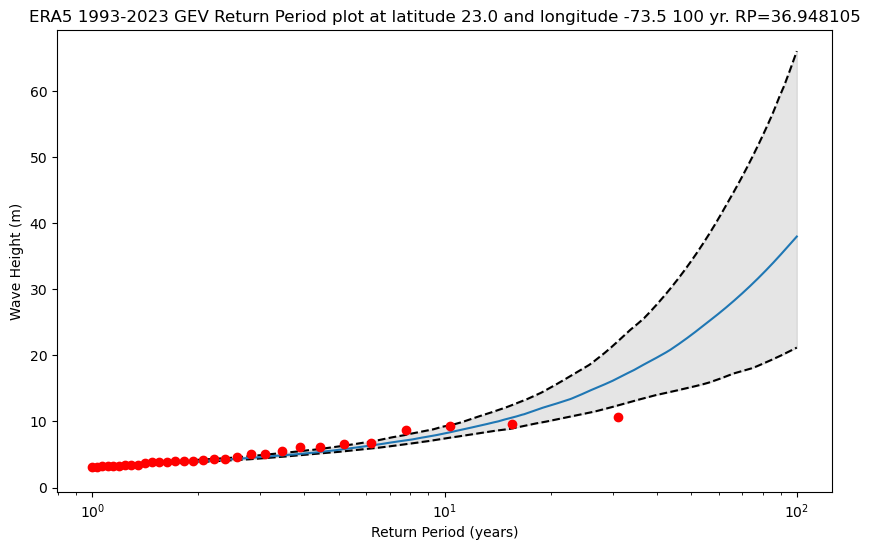

In [6]:
#Jamaica :)
bootstrap_samples=100 # number of random repititions to give ensemble range


ann_max=Annual_max_30yrs.sel(latitude=18.5,longitude=283.5)
ann_max=Annual_max_30yrs.sel(latitude=22.5,longitude=285.5)
ann_max=Annual_max_30yrs.sel(latitude=23,longitude=286.5)
# ann_max=Annual_max_30yrs.sel(latitude=23,longitude=285.5)
# ann_max=Annual_max_30yrs.sel(latitude=23,longitude=285)

lat=ann_max.latitude.values+0
lon=ann_max.longitude.values+0

data=ann_max[var].to_numpy()
data

x = np.sort(data)
print ("Emperical annual maximas= ",x)
y = np.arange(1, len(x) + 1)
y_rp=((y[::-1])/len(y))**-1
print ("Emperical return periods =",y_rp)


actual_param=genextreme.fit(data)
actual_years = np.arange(0.1, 100, 0.1)
actual_levels=genextreme.ppf(1 - 1 / actual_years, *actual_param)
RP_100=genextreme.ppf(1 - 1 / 100, *actual_param)
RP_31=genextreme.ppf(1 - 1 / 31, *actual_param)

# plot return mean levels
plt.plot(actual_years, actual_levels)

# find empirical return levels
plt.plot(y_rp, x, 'ro', label='Return Levels')

plt.title(f'ERA5 1993-2023 GEV Return Period plot at latitude {lat} and longitude {reverse_longitude_converter(lon)} 100 yr. RP={RP_100:2f}')
plt.xscale("log")

plt.show()


# initalize list to store parameters from samples
params = []

# generate 1000 samples by resampling data with replacement
for i in range(bootstrap_samples):
    params.append(
        genextreme.fit(np.random.choice(data, size=data.size, replace=True))
    )



# generate years vector
years = np.arange(0.1, 100, 0.1)

# intialize list for return levels
levels = []

# calculate return levels for each of the 1000 samples
for i in range(bootstrap_samples):
    levels.append(genextreme.ppf(1 - 1 / years, *params[i]))
levels = np.array(levels)

# setup plots
fig, ax = plt.subplots(figsize=(10, 6))





# plot confidence intervals
_ = ax.plot(years, np.quantile(levels, [0.25, 0.75], axis=0).T, "k--")
_ = ax.fill_between(years, np.quantile(levels, 0.25, axis=0).T, np.quantile(levels, 0.75, axis=0).T, color='gray', alpha=0.2, label='Confidence Intervals')

# plot return mean levels
# _ = ax.plot(years, levels.mean(axis=0))
_ = ax.plot(years, np.median(levels, axis=0))


# find empirical return levels
_ = ax.plot(y_rp, x, 'ro', label='Return Levels')

# aesthetics
# ax.set_xlim(0, 100)
# ax.set_ylim(np.floor(min(x))-.5, np.ceil(max(x))+.5)
ax.set_xscale("log")
ax.set_xlabel('Return Period (years)')
ax.set_ylabel('Wave Height (m)')

ax.set_title(f'ERA5 1993-2023 GEV Return Period plot at latitude {lat} and longitude {reverse_longitude_converter(lon)} 100 yr. RP={RP_100:2f}')


Text(0, 0.5, 'Wave Height (m)')

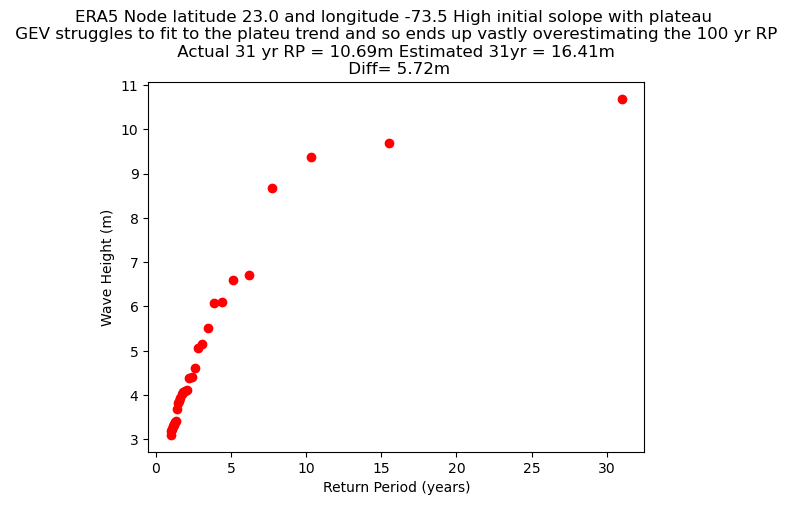

In [7]:

# find empirical return levels
plt.plot(y_rp, x, 'ro', label='Return Levels')

plt.title(f'ERA5 Node latitude {lat} and longitude {reverse_longitude_converter(lon)} High initial solope with plateau \n GEV struggles to fit to the plateu trend and so ends up vastly overestimating the 100 yr RP \n Actual 31 yr RP = {np.max(x):0.2f}m Estimated 31yr = {RP_31:0.2f}m \n Diff= {RP_31-np.max(x):0.2f}m')
plt.xlabel('Return Period (years)')
plt.ylabel('Wave Height (m)')
# plt.xscale("log")

Testing all different types of fits because of instability in GEV sometimes

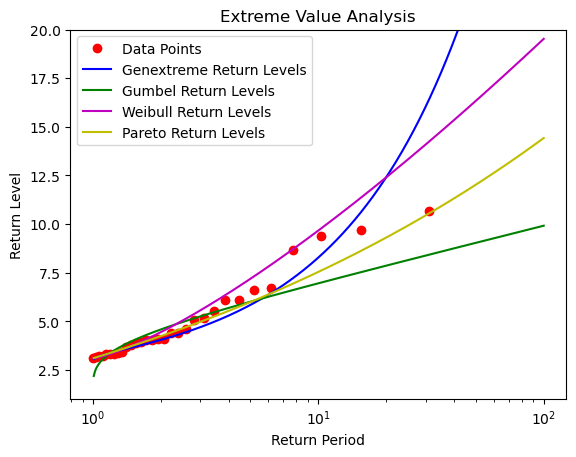

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import genextreme, gumbel_r, weibull_min, norm, pareto, poisson

# Assuming x and y_rp are your data arrays
plt.plot(y_rp, x, 'ro', label='Data Points') # Plot data points

# Fit Genextreme distribution
a, b, c = genextreme.fit(x)

# Define return periods
return_periods = np.arange(0.1, 100, 0.01)

# Calculate return levels for Genextreme distribution
return_levels_genextreme = genextreme.isf(1/return_periods, a, b, c)

# Fit Gumbel distribution
params_gumbel = gumbel_r.fit(x)

# Calculate return levels for Gumbel distribution
return_levels_gumbel = gumbel_r.isf(1/return_periods, *params_gumbel)

# Fit Weibull distribution
params_weibull = weibull_min.fit(x)

# Calculate return levels for Weibull distribution
return_levels_weibull = weibull_min.isf(1/return_periods, *params_weibull)

# Fit Normal distribution
mu, sigma = norm.fit(x)

# Calculate return levels for Normal distribution
return_levels_normal = norm.isf(1/return_periods, loc=mu, scale=sigma)

# Fit Pareto distribution
params_pareto = pareto.fit(x)

# Calculate return levels for Pareto distribution
return_levels_pareto = pareto.isf(1/return_periods, *params_pareto)

# Estimate Poisson parameter based on the mean of the data
lambda_poisson = np.mean(x)

# Calculate return levels for Poisson distribution
return_levels_poisson = poisson.isf(1/return_periods, lambda_poisson)

# Plot return levels for Genextreme distribution
plt.plot(return_periods, return_levels_genextreme, 'b', label='Genextreme Return Levels')

# Plot return levels for Gumbel distribution
plt.plot(return_periods, return_levels_gumbel, 'g', label='Gumbel Return Levels')

# Plot return levels for Weibull distribution
plt.plot(return_periods, return_levels_weibull, 'm', label='Weibull Return Levels')

# Plot return levels for Normal distribution
# plt.plot(return_periods, return_levels_normal, 'c', label='Normal Return Levels')

# Plot return levels for Pareto distribution
plt.plot(return_periods, return_levels_pareto, 'y', label='Pareto Return Levels')

# Plot return levels for Poisson distribution
# plt.plot(return_periods, return_levels_poisson, 'k', label='Poisson Return Levels')

# Label axes and add title
plt.xlabel('Return Period')
plt.ylabel('Return Level')
plt.title('Extreme Value Analysis')
plt.xscale("log")
plt.ylim(1,20)

# Add legend and display plot
plt.legend()
plt.show()


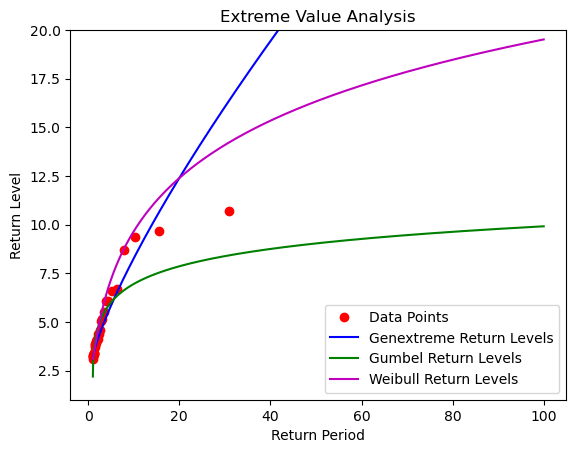

In [9]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import genextreme, gumbel_l,weibull_min

# Assuming x and y_rp are your data arrays
plt.plot(y_rp, x, 'ro', label='Data Points') # Plot data points

# Fit Genextreme distribution
a,b,c = genextreme.fit(x)

# Define return periods
return_periods =  np.arange(0.1, 100, 0.01)

# Calculate return levels for Genextreme distribution
return_levels = genextreme.isf(1/return_periods, a,b,c)


# Fit Weibull distribution
params_weibull = weibull_min.fit(x)

# Calculate return levels for Weibull distribution
return_levels_weibull = weibull_min.isf(1/return_periods, *params_weibull)

# Fit Gumbel distribution
params_gumbel = gumbel_r.fit(x)

# Calculate return levels for Gumbel distribution
return_levels_gumbel = gumbel_r.isf(1/return_periods, *params_gumbel)

# Plot return levels for Genextreme distribution
plt.plot(return_periods, return_levels, 'b', label='Genextreme Return Levels')

# Plot return levels for Gumbel distribution
plt.plot(return_periods, return_levels_gumbel, 'g', label='Gumbel Return Levels')

# Plot return levels for Weibull distribution
plt.plot(return_periods, return_levels_weibull, 'm', label='Weibull Return Levels')

# Label axes and add title
plt.xlabel('Return Period')
plt.ylabel('Return Level')
plt.title('Extreme Value Analysis')
plt.ylim(1,20)

# Add legend and display plot
plt.legend()
plt.show()


In [10]:
df_unique_final=pd.read_csv(r"E:\Unique_Points_no_nan_GCM_2014.csv")
df_unique_final.dropna(subset=["lat"], inplace=True) #drop nans
df_unique_final

,lat,lon,lat_lon
0,-50.5,284.5,"(-50.5, 284.5)"
1,-47.5,285.0,"(-47.5, 285.0)"
2,-48.5,284.5,"(-48.5, 284.5)"
3,-49.0,284.5,"(-49.0, 284.5)"
4,-53.5,286.0,"(-53.5, 286.0)"
...,...,...,...
5537,64.0,37.5,"(64.0, 37.5)"
5538,65.0,37.5,"(65.0, 37.5)"
5539,65.0,37.0,"(65.0, 37.0)"
5540,64.5,36.5,"(64.5, 36.5)"


In [11]:

df_unique_final["30_year_RP"]=np.nan
df_unique_final["5_year_RP"]=np.nan
df_unique_final["100_year_RP"]=np.nan
df_unique_final["indexa"]=df_unique_final.index
df_unique_final["EVA_Type"]="GEV"
df_unique_final["EVA_color"]=0
df_unique_final["30_yr_RP_measured"]=0.0
df_unique_final["lat_lon"]=list(zip(df_unique_final["lat"],df_unique_final["lon"])) #change from string to tuple due to read_csv

df_unique_final

,lat,lon,lat_lon,30_year_RP,5_year_RP,100_year_RP,indexa,EVA_Type,EVA_color,30_yr_RP_measured
0,-50.5,284.5,"(-50.5, 284.5)",NaN,NaN,NaN,0,GEV,0,0.0
1,-47.5,285.0,"(-47.5, 285.0)",NaN,NaN,NaN,1,GEV,0,0.0
2,-48.5,284.5,"(-48.5, 284.5)",NaN,NaN,NaN,2,GEV,0,0.0
3,-49.0,284.5,"(-49.0, 284.5)",NaN,NaN,NaN,3,GEV,0,0.0
4,-53.5,286.0,"(-53.5, 286.0)",NaN,NaN,NaN,4,GEV,0,0.0
...,...,...,...,...,...,...,...,...,...,...
5537,64.0,37.5,"(64.0, 37.5)",NaN,NaN,NaN,5537,GEV,0,0.0
5538,65.0,37.5,"(65.0, 37.5)",NaN,NaN,NaN,5538,GEV,0,0.0
5539,65.0,37.0,"(65.0, 37.0)",NaN,NaN,NaN,5539,GEV,0,0.0
5540,64.5,36.5,"(64.5, 36.5)",NaN,NaN,NaN,5540,GEV,0,0.0


In [12]:
from scipy.stats import genextreme,weibull_min,gumbel_r,pareto
#run loop for each nearshore ERA5 point
#threshold to start switching between EVA fits is 3m absolute difference between 31yr estimated and ERA5 assimilated
thresh=100
bootstrap_samples=100


for idx ,(lat,lon) in tqdm(enumerate(df_unique_final["lat_lon"]),desc="Points calculated"):


    ann_max=Annual_max_30yrs.sel(latitude=lat,longitude=lon)


    data=ann_max[var].to_numpy()
    data

    if np.all(np.isnan(data)):
      continue
 #Calc the return periods
    # Fit the GEV distribution to the data
    shape, loc, scale = genextreme.fit(data)
    # Fit Weibull distribution
    params_weibull = weibull_min.fit(data)
    # Fit gumbel distribution
    params_gumbel = gumbel_r.fit(data)   
    # Fit Pareto distribution
    params_pareto = pareto.fit(data) 

   #30 year return period check
    check_year=len(data)
    yr_30_gev=genextreme.isf(1/check_year, shape, loc, scale) 
    yr_30_wei = weibull_min.isf(1/check_year, *params_weibull)
    yr_30_gum = gumbel_r.isf(1/check_year, *params_gumbel)
    yr_30_pareto = pareto.isf(1/check_year, *params_pareto)


    difference_gev=np.abs(yr_30_gev-max(data))
    difference_wei=np.abs(yr_30_wei-max(data))
    difference_gum=np.abs(yr_30_gum-max(data))
    difference_pareto=np.abs(yr_30_pareto-max(data))


    # Calculate the return levels for the specified return periods
    return_periods = np.array([30, 5, 100])
    if difference_gev>thresh:
         if difference_wei<difference_gum and difference_wei<difference_pareto and difference_wei<difference_gev:
            # Calculate return levels for Weibull distribution
            return_levels = weibull_min.isf(1/return_periods, *params_weibull)
            fit_type="weibull"
            df_unique_final.iloc[i,8]=1
         elif difference_gum<difference_wei and difference_gum<difference_pareto and difference_gum<difference_gev:
            # Calculate return levels for Weibull distribution
            return_levels = gumbel_r.isf(1/return_periods, *params_gumbel)
            fit_type="gumbel"
            df_unique_final.iloc[i,8]=2   
         elif difference_pareto<difference_wei and difference_pareto<difference_gum and difference_pareto<difference_gev:
            # Calculate return levels for Weibull distribution
            return_levels = pareto.isf(1/return_periods, *params_pareto)
            fit_type="pareto"
            df_unique_final.iloc[i,8]=3           
         else:
            return_levels = genextreme.isf(1/return_periods, shape, loc, scale)
            fit_type="GEV"
    else:
      return_levels = genextreme.isf(1/return_periods, shape, loc, scale)
      fit_type="GEV"  

    df_unique_final.iloc[idx,3]=return_levels[0]
    df_unique_final.iloc[idx,4]=return_levels[1]
    df_unique_final.iloc[idx,5]=return_levels[2]
    df_unique_final.iloc[idx,7]=fit_type
    df_unique_final.iloc[idx,9]=max(data)
    continue

    
   #  if i % 30 == 0:
    if difference_gev>thresh:
      x = np.sort(data)
      y = np.arange(1, len(x) + 1)
      y_rp=((y[::-1])/len(y))**-1

      print(f"GEV= {difference_gev:0.2f},Weibul= {difference_wei:0.2f}, gum= {difference_gum:0.2f},pareto= {difference_pareto:0.2f}")
      # initalize list to store parameters from samples
      params = []

      #Get bootstrap confidence parameters
      if difference_gev>thresh:
         for i in range(bootstrap_samples):
            if difference_wei<difference_gum and difference_wei<difference_pareto and difference_wei<difference_gev:
               params.append(weibull_min.fit(np.random.choice(data, size=data.size, replace=True)))   
            elif difference_gum<difference_wei and difference_gum<difference_pareto and difference_gum<difference_gev:
               params.append(gumbel_r.fit(np.random.choice(data, size=data.size, replace=True)))   
            elif difference_pareto<difference_wei and difference_pareto<difference_gum and difference_pareto<difference_gev:
               params.append(pareto.fit(np.random.choice(data, size=data.size, replace=True))) 
            else:
               params.append(genextreme.fit(np.random.choice(data, size=data.size, replace=True)))
      else:
      # generate 1000 samples by resampling data with replacement
         for i in range(bootstrap_samples):
               params.append(genextreme.fit(np.random.choice(data, size=data.size, replace=True)))      



      # generate years vector
      years = np.arange(0.1, 100, 0.01)

      # intialize list for return levels
      levels = []


      # calculate return levels for each of the 1000 samples
      if difference_gev>thresh  :
         for i in range(bootstrap_samples):
            if difference_wei<difference_gum and difference_wei<difference_pareto and difference_wei<difference_gev:
               levels.append(weibull_min.isf( 1 / years, *params[i]))
               save_fig_at=r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_wave_height\ERA5 Nearshore Mapping\Step 2- Calculating RP at all ERA5 nodes\abnormal_fits_3m_thresh\Weibul fits better"
            elif difference_gum<difference_wei and difference_gum<difference_pareto and difference_gum<difference_gev:
               levels.append(gumbel_r.isf( 1 / years, *params[i]))  
               save_fig_at=r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_wave_height\ERA5 Nearshore Mapping\Step 2- Calculating RP at all ERA5 nodes\abnormal_fits_3m_thresh\Gumbel fits better"
            elif difference_pareto<difference_wei and difference_pareto<difference_gum and difference_pareto<difference_gev:
               levels.append(pareto.isf( 1 / years, *params[i]))  
               save_fig_at=r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_wave_height\ERA5 Nearshore Mapping\Step 2- Calculating RP at all ERA5 nodes\abnormal_fits_3m_thresh\Pareto fits better"
            else:
               levels.append(genextreme.isf( 1 / years, *params[i]))
      else:
         for i in range(bootstrap_samples):
            levels.append(genextreme.isf( 1 / years, *params[i]))      


      levels = np.array(levels)       

      #Setup_plot for all distribution types REGARDLESS
      levels_regardless_genex = []
      params_regardless_genex=[]
      for i in range(bootstrap_samples):
         params_regardless_genex.append(
         genextreme.fit(np.random.choice(data, size=data.size, replace=True))
            )
         levels_regardless_genex.append(genextreme.isf( 1 / years, *params_regardless_genex[i]))

      levels_regardless_genex = np.array(levels_regardless_genex)

      #Weibul
      levels_regardless_wei = []
      params_regardless_wei=[]
      for i in range(bootstrap_samples):
         params_regardless_wei.append(
         weibull_min.fit(np.random.choice(data, size=data.size, replace=True))
            )
         levels_regardless_wei.append(weibull_min.isf( 1 / years, *params_regardless_wei[i]))

      levels_regardless_wei = np.array(levels_regardless_wei)   

      #GUMBEL
      levels_regardless_gum = []
      params_regardless_gum=[]
      for i in range(bootstrap_samples):
         params_regardless_gum.append(
         gumbel_r.fit(np.random.choice(data, size=data.size, replace=True))
            )
         levels_regardless_gum.append(gumbel_r.isf( 1 / years, *params_regardless_gum[i]))

      levels_regardless_gum = np.array(levels_regardless_gum)      

      #Pareto
      levels_regardless_pareto = []
      params_regardless_pareto=[]
      for i in range(bootstrap_samples):
         params_regardless_pareto.append(
         pareto.fit(np.random.choice(data, size=data.size, replace=True))
            )
         levels_regardless_pareto.append(pareto.isf( 1 / years, *params_regardless_pareto[i]))

      levels_regardless_pareto= np.array(levels_regardless_pareto) 

      # setup plots
      fig, ax = plt.subplots(figsize=(10, 6))





      # plot confidence intervals
      _ = ax.plot(years, np.quantile(levels, [0.25, 0.75], axis=0).T, "k--")
      _ = ax.fill_between(years, np.quantile(levels, 0.25, axis=0).T, np.quantile(levels, 0.75, axis=0).T, color='gray', alpha=0.2, label='Confidence Intervals (25th% to 75th%)')

      # plot GEV return mean levels
      _ = ax.plot(years, np.median(levels_regardless_genex,axis=0),label='Fitted GEV Wave Height - Median')

      # plot gumbel return mean levels
      _ = ax.plot(years, np.median(levels_regardless_gum,axis=0),label='Fitted gumbel Wave Height - Median')      

      # plot weibull return mean levels
      _ = ax.plot(years, np.median(levels_regardless_wei,axis=0),label='Fitted weibull Wave Height - Median')         

      # plot pareto return mean levels
      _ = ax.plot(years, np.median(levels_regardless_pareto,axis=0),label='Fitted pareto Wave Height - Median')  

      # plot return median levels
      _ = ax.plot(years, np.median(levels,axis=0),label=f'Actual Fit type: {fit_type} Wave Height - Median')

      # find empirical return levels
      _ = ax.plot(y_rp, x, 'ro', label='ERA5 Reanalyzed Offshore Wave Height')

      # aesthetics
      # ax.set_xlim(0, 100)
      # ax.set_ylim(np.floor(min(x))-.5, np.ceil(max(x))+.5)
      ax.set_xscale("log")
      ax.set_xlabel('Return Period (years)')
      ax.set_ylabel('Wave Height (m)')

      ax.set_title(f'ERA5 1993-2023 {fit_type} Return Period plot at latitude {lat} and longitude {reverse_longitude_converter(lon)}')

      # Save plot as PNG
      file_name=f'ERA5 1993-2023 {fit_type} RP lat_{lat}_lon_{reverse_longitude_converter(lon)}.png'
      long_path=os.path.join(save_fig_at,file_name)
      plt.legend(loc="best")
      # plt.savefig(long_path)

      # Close the current figure to avoid warnings
      plt.close()

# plt.show()
df_unique_final


Points calculated: 3762it [05:19, 13.75it/s]c:\Users\cro005\AppData\Local\miniconda3\envs\ihe-course\lib\site-packages\scipy\stats\_continuous_distns.py:6932: RuntimeWarning: divide by zero encountered in log
  return ndata / np.sum(np.log((data - location) / scale))
c:\Users\cro005\AppData\Local\miniconda3\envs\ihe-course\lib\site-packages\scipy\stats\_continuous_distns.py:6948: RuntimeWarning: divide by zero encountered in divide
  return (shape + 1) * np.sum(1 / (data - location))
c:\Users\cro005\AppData\Local\miniconda3\envs\ihe-course\lib\site-packages\scipy\stats\_continuous_distns.py:6932: RuntimeWarning: divide by zero encountered in scalar divide
  return ndata / np.sum(np.log((data - location) / scale))
c:\Users\cro005\AppData\Local\miniconda3\envs\ihe-course\lib\site-packages\scipy\stats\_continuous_distns.py:6955: RuntimeWarning: invalid value encountered in scalar subtract
  return dL_dLocation(shape, location) - dL_dScale(shape, scale)
c:\Users\cro005\AppData\Local\minico

,lat,lon,lat_lon,30_year_RP,5_year_RP,100_year_RP,indexa,EVA_Type,EVA_color,30_yr_RP_measured
0,-50.5,284.5,"(-50.5, 284.5)",9.398992,8.533829,9.837799,0,GEV,0,10.066221
1,-47.5,285.0,"(-47.5, 285.0)",6.406324,5.976408,6.603720,1,GEV,0,6.627725
2,-48.5,284.5,"(-48.5, 284.5)",6.406474,6.036156,6.546976,2,GEV,0,6.485739
3,-49.0,284.5,"(-49.0, 284.5)",5.480035,5.006291,5.698893,3,GEV,0,5.796894
4,-53.5,286.0,"(-53.5, 286.0)",7.985608,7.017489,8.759882,4,GEV,0,8.394776
...,...,...,...,...,...,...,...,...,...,...
5537,64.0,37.5,"(64.0, 37.5)",2.802555,2.371335,3.044018,5537,GEV,0,3.015346
5538,65.0,37.5,"(65.0, 37.5)",4.214329,3.697022,4.458427,5538,GEV,0,4.635912
5539,65.0,37.0,"(65.0, 37.0)",3.814891,3.469374,3.936478,5539,GEV,0,3.963868
5540,64.5,36.5,"(64.5, 36.5)",3.166288,2.760801,3.378970,5540,GEV,0,3.319051


In [13]:
df_unique_final=df_unique_final.drop(columns=["30_year_RP"])
df_unique_final

,lat,lon,lat_lon,5_year_RP,100_year_RP,indexa,EVA_Type,EVA_color,30_yr_RP_measured
0,-50.5,284.5,"(-50.5, 284.5)",8.533829,9.837799,0,GEV,0,10.066221
1,-47.5,285.0,"(-47.5, 285.0)",5.976408,6.603720,1,GEV,0,6.627725
2,-48.5,284.5,"(-48.5, 284.5)",6.036156,6.546976,2,GEV,0,6.485739
3,-49.0,284.5,"(-49.0, 284.5)",5.006291,5.698893,3,GEV,0,5.796894
4,-53.5,286.0,"(-53.5, 286.0)",7.017489,8.759882,4,GEV,0,8.394776
...,...,...,...,...,...,...,...,...,...
5537,64.0,37.5,"(64.0, 37.5)",2.371335,3.044018,5537,GEV,0,3.015346
5538,65.0,37.5,"(65.0, 37.5)",3.697022,4.458427,5538,GEV,0,4.635912
5539,65.0,37.0,"(65.0, 37.0)",3.469374,3.936478,5539,GEV,0,3.963868
5540,64.5,36.5,"(64.5, 36.5)",2.760801,3.378970,5540,GEV,0,3.319051


In [14]:
# Plot using Plotly Express
fig = px.scatter_mapbox(df_unique_final,
                        lat='lat',
                        lon='lon',
                        color="EVA_color",
                        hover_data="5_year_RP",
                        mapbox_style="carto-positron")

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat, lon=lon), zoom=0.2))
fig.show()

In [15]:
# Plot using Plotly Express
fig = px.scatter_mapbox(df_unique_final,
                        lat='lat',
                        lon='lon',
                        color="5_year_RP",
                        hover_data="5_year_RP",
                        mapbox_style="carto-positron")

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat, lon=lon), zoom=0.2))
fig.show()

In [16]:
df_unique_final

,lat,lon,lat_lon,5_year_RP,100_year_RP,indexa,EVA_Type,EVA_color,30_yr_RP_measured
0,-50.5,284.5,"(-50.5, 284.5)",8.533829,9.837799,0,GEV,0,10.066221
1,-47.5,285.0,"(-47.5, 285.0)",5.976408,6.603720,1,GEV,0,6.627725
2,-48.5,284.5,"(-48.5, 284.5)",6.036156,6.546976,2,GEV,0,6.485739
3,-49.0,284.5,"(-49.0, 284.5)",5.006291,5.698893,3,GEV,0,5.796894
4,-53.5,286.0,"(-53.5, 286.0)",7.017489,8.759882,4,GEV,0,8.394776
...,...,...,...,...,...,...,...,...,...
5537,64.0,37.5,"(64.0, 37.5)",2.371335,3.044018,5537,GEV,0,3.015346
5538,65.0,37.5,"(65.0, 37.5)",3.697022,4.458427,5538,GEV,0,4.635912
5539,65.0,37.0,"(65.0, 37.0)",3.469374,3.936478,5539,GEV,0,3.963868
5540,64.5,36.5,"(64.5, 36.5)",2.760801,3.378970,5540,GEV,0,3.319051


In [17]:
# Plot using Plotly Express
fig = px.scatter_mapbox(df_unique_final,
                        lat='lat',
                        lon='lon',
                        color="100_year_RP",
                        hover_data="100_year_RP",
                        mapbox_style="carto-positron")

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat, lon=lon), zoom=0.2))
fig.show()

Save Global Node Values

In [20]:
df_unique_final.to_csv(r"E:\Nodes_ERA5_GCM_nodes_5yr100yr_RP_GEV_only.csv",index=None)

In [21]:
df_final=pd.read_csv(r"E:\Nodes_ERA5_GCM_nodes_5yr100yr_RP_GEV_only.csv")
df_final

,lat,lon,lat_lon,5_year_RP,100_year_RP,indexa,EVA_Type,EVA_color,30_yr_RP_measured
0,-50.5,284.5,"(-50.5, 284.5)",8.533829,9.837799,0,GEV,0,10.066221
1,-47.5,285.0,"(-47.5, 285.0)",5.976408,6.603720,1,GEV,0,6.627725
2,-48.5,284.5,"(-48.5, 284.5)",6.036156,6.546976,2,GEV,0,6.485739
3,-49.0,284.5,"(-49.0, 284.5)",5.006291,5.698893,3,GEV,0,5.796894
4,-53.5,286.0,"(-53.5, 286.0)",7.017489,8.759882,4,GEV,0,8.394776
...,...,...,...,...,...,...,...,...,...
5536,64.0,37.5,"(64.0, 37.5)",2.371335,3.044018,5537,GEV,0,3.015346
5537,65.0,37.5,"(65.0, 37.5)",3.697022,4.458427,5538,GEV,0,4.635912
5538,65.0,37.0,"(65.0, 37.0)",3.469374,3.936478,5539,GEV,0,3.963868
5539,64.5,36.5,"(64.5, 36.5)",2.760801,3.378970,5540,GEV,0,3.319051


In [22]:
df_unique_final=pd.read_csv(r"E:\All_Transects_GCMmap_2014_zip_added.csv")
df_unique_final

,Unnamed: 0,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,near_lat,near_lon,Lat_Lon
0,0,BOX_028_183_0,CHL,South America,Chile,-74.386310,-50.377659,-74.390966,-50.382558,-74.395623,-50.387456,-50.5,284.5,"(-50.5, 284.5)"
1,1,BOX_028_183_1,CHL,South America,Chile,-74.382469,-50.379144,-74.387125,-50.384042,-74.391782,-50.388940,-50.5,284.5,"(-50.5, 284.5)"
2,2,BOX_028_183_2,CHL,South America,Chile,-74.378628,-50.380629,-74.383284,-50.385527,-74.387941,-50.390425,-50.5,284.5,"(-50.5, 284.5)"
3,3,BOX_028_183_3,CHL,South America,Chile,-74.373950,-50.382583,-74.379517,-50.387079,-74.385083,-50.391574,-50.5,284.5,"(-50.5, 284.5)"
4,4,BOX_028_183_4,CHL,South America,Chile,-74.370425,-50.384358,-74.375991,-50.388853,-74.381558,-50.393348,-50.5,284.5,"(-50.5, 284.5)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739821,1739821,BOX_211_067_149,RUS,Europe,Russia,39.929937,64.701462,39.935198,64.698350,39.940460,64.695238,66.5,41.0,"(66.5, 41.0)"
1739822,1739822,BOX_211_067_150,RUS,Europe,Russia,39.933577,64.702586,39.938839,64.699474,39.944100,64.696363,66.5,41.0,"(66.5, 41.0)"
1739823,1739823,BOX_211_067_151,RUS,Europe,Russia,39.935546,64.703502,39.942003,64.700833,39.948460,64.698164,66.5,41.0,"(66.5, 41.0)"
1739824,1739824,BOX_211_067_152,RUS,Europe,Russia,39.937050,64.704370,39.944697,64.702356,39.952343,64.700341,66.5,41.0,"(66.5, 41.0)"


Merge Global Node Values to Global transects to Map/"Downscale" Offshore waveheights

In [23]:
df_final_merged = pd.merge(left=df_final, right=df_unique_final, left_on="lat_lon", right_on="Lat_Lon")
df_final_merged


,lat,lon,lat_lon,5_year_RP,100_year_RP,indexa,EVA_Type,EVA_color,30_yr_RP_measured,Unnamed: 0,...,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,near_lat,near_lon,Lat_Lon
0,-50.5,284.5,"(-50.5, 284.5)",8.533829,9.837799,0,GEV,0,10.066221,0,...,Chile,-74.386310,-50.377659,-74.390966,-50.382558,-74.395623,-50.387456,-50.5,284.5,"(-50.5, 284.5)"
1,-50.5,284.5,"(-50.5, 284.5)",8.533829,9.837799,0,GEV,0,10.066221,1,...,Chile,-74.382469,-50.379144,-74.387125,-50.384042,-74.391782,-50.388940,-50.5,284.5,"(-50.5, 284.5)"
2,-50.5,284.5,"(-50.5, 284.5)",8.533829,9.837799,0,GEV,0,10.066221,2,...,Chile,-74.378628,-50.380629,-74.383284,-50.385527,-74.387941,-50.390425,-50.5,284.5,"(-50.5, 284.5)"
3,-50.5,284.5,"(-50.5, 284.5)",8.533829,9.837799,0,GEV,0,10.066221,3,...,Chile,-74.373950,-50.382583,-74.379517,-50.387079,-74.385083,-50.391574,-50.5,284.5,"(-50.5, 284.5)"
4,-50.5,284.5,"(-50.5, 284.5)",8.533829,9.837799,0,GEV,0,10.066221,4,...,Chile,-74.370425,-50.384358,-74.375991,-50.388853,-74.381558,-50.393348,-50.5,284.5,"(-50.5, 284.5)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739176,64.5,37.5,"(64.5, 37.5)",NaN,NaN,5541,GEV,0,0.000000,1739601,...,Russia,37.599721,64.363515,37.595273,64.360138,37.590824,64.356761,64.5,37.5,"(64.5, 37.5)"
1739177,64.5,37.5,"(64.5, 37.5)",NaN,NaN,5541,GEV,0,0.000000,1739602,...,Russia,37.603623,64.362553,37.599175,64.359176,37.594726,64.355798,64.5,37.5,"(64.5, 37.5)"
1739178,64.5,37.5,"(64.5, 37.5)",NaN,NaN,5541,GEV,0,0.000000,1739603,...,Russia,37.607526,64.361590,37.603077,64.358213,37.598628,64.354836,64.5,37.5,"(64.5, 37.5)"
1739179,64.5,37.5,"(64.5, 37.5)",NaN,NaN,5541,GEV,0,0.000000,1739604,...,Russia,37.611428,64.360628,37.606979,64.357251,37.602530,64.353873,64.5,37.5,"(64.5, 37.5)"


In [26]:
import plotly.express as px

lat = 18.1
lon = -77.3
view_width = 10

# Filter dataframe within specified range
filtered_df = df_final_merged[
    (df_final_merged["Intersect_lon"] < lon + 18) & 
    (df_final_merged["Intersect_lon"] > lon - 7.5) & 
    (df_final_merged["Intersect_lat"] < lat + 9) & 
    (df_final_merged["Intersect_lat"] > lat - 8)
]

# Plot using Plotly Express
fig = px.scatter_mapbox(filtered_df,
                        lat='Intersect_lat',
                        lon='Intersect_lon',
                        color="5_year_RP",
                        hover_data="5_year_RP",
                        mapbox_style="carto-positron",width=1000,
                        height=600)

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat+1, lon=lon+4), zoom=4),title="100 yr Wave_Height Return-Period Distribution along Caribbean's shoreline")
fig.show()

In [25]:
df_unique_final.to_csv(r"E:\Global_Transects_ERA5_GCM_nodes_5yr100yr_RP_GEV_only.csv",index=False)